In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [30]:
import matplotlib.pyplot as plt
import numpy as np
import glob as glob
import matplotlib.gridspec as gridspec
from netCDF4 import Dataset

import matplotlib.colors as colors
import matplotlib.cm as cmx
from itertools import product

import time
from datetime import datetime

import scipy.io as sio

import matplotlib.tri as tri

from mpl_toolkits.basemap import Basemap

import cmocean #--> to install

In [31]:
def plot_swot(axn, var, lonv, latv, vmin, vmax, cmap, merv, parv, box, plotstyle, levels=0): 
    """
    Improve part of if lon, lat 1D or 2D
    Plots an individual plot of the data using scatter and Basemap.
    Input variables:
    - xx = x-axis variable, in this case, longitude
    - yy = y-axis variable, in this case, latitude
    - var = variable to be plotted
    - ax = axis
    - box = box region of the area wanted to be shown
    , where box is a 1 x 4 array: 
    [minimum_longitude maximum_longitude minimum_latitude maximum_latitude]
    - vmin = minimum value of the colorbar 
    - vmax = maximum value of the colorbar
    - merv = a 1 x 4 array to know if to label and where the meridians
    -- [0 0 0 0] = no labels
    -- [1 0 0 1]
    - parv = like merv, but for the parallels' labels
    - cmap = colormap to be used
    - plotstyle:
    -- '0' only scatter
    -- '1' scatter with contour
    - levels: levels of contour.  
    -- 0 if none (or just scatter)
    -- levels = np.arange(min, max, interval)
    Output variables:
    - c1 = plot object (for colorbar)
    - my_mapn = map obejct (to do more plots on same figure)
    """
    
    lomin = box[0]
    lomax = box[1]
    lamin = box[2]
    lamax = box[3]
    
    my_mapn = Basemap(projection='merc'
                      , lat_0=(lamin+lamax)/2
                      , lon_0=(lomin+lomax)/2
                      , resolution = 'i'
                      , llcrnrlon = lomin, llcrnrlat= lamin
                      , urcrnrlon = lomax
                      , urcrnrlat = lamax, ax = axn
                      , area_thresh = 10)
    
    x, y = my_mapn(lonv, latv) # compute map proj coordinates.
    
    if plotstyle == '1':
        my_mapn.contour(x, y, var, levels, colors='w', linewidth=2) 
    c1 = my_mapn.scatter(x, y, c=var, linewidth='0'
                         , vmin=vmin, vmax=vmax, cmap=cmap)

    my_mapn.drawcoastlines() 
    my_mapn.drawmapboundary()
    my_mapn.fillcontinents(color='.75') #
    my_mapn.drawmeridians(np.arange(-160, 140, 1), labels=merv, size=18)
    my_mapn.drawparallels(np.arange(0.5, 70.5, 1), labels=parv, size=18)
    
    return my_mapn, c1

In [32]:
def box_rmse(sshm, ssho, milon, malon, milat, malat, *args):
    
    # latn, latnb, sshm, ssho, milon, malon, milat, malat
    if args: #len(args) == 8:
        b1 = np.where(latn == latnb[milat, milon])   
        b3 = np.where(latn == latnb[malat, malon])

        data = sshm[b3[0]:b1[0], b1[1]:b3[1]]
        esti = ssho[b3[0]:b1[0], b1[1]:b3[1]]

    elif not args: #len(args) == 6:
        data = SSH_modelnb[milat:malat, milon:malon]
        esti = SSH_obsnb[milat:malat, milon:malon]
    
    else:
        print('Missing inputs')
    rmsE = sqrt( sum( (data.ravel() - esti.ravel())**2) / size(data) )
    print(rmsE)
    

In [33]:
def load_filt_ssh(mx):
    ssh_r_LDx = mx['ssh_r_LD']
    sshm_LD1  = mx['sshm_LD1']
    sshm_LD2  = mx['sshm_LD2']
    ssho_LD1  = mx['ssho_LD1']
    ssho_LD2  = mx['ssho_LD2']

    sshm_LDx = np.concatenate((sshm_LD1, sshm_LD2), axis=0)
    ssho_LDx = np.concatenate((ssho_LD1, ssho_LD2), axis=0)
    
    return ssh_r_LDx, sshm_LDx, ssho_LDx

In [34]:
def noband(SSH_model, SSH_obs, lon, lat):
    """
    adaf
    """
    size_obs = SSH_obs.shape #before ss4
    dlon = np.diff(lon[30,:])  # 30 = arbitrary row (indices will be the same for the rest of the rows)
    #before dl4

    if (np.any(dlon>0.03)): #  if the half-swath trail present in the pass there will be 2 longitude jumps of ~0.1 instead of all ~0.02
            ff = np.ma.masked_all((size_obs[0], 4))

            SSH_modelnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            SSH_modelnb[:, 0:26] = SSH_model[:, 0:26]  # HAVE TO PUT ONE EXTRA INDEX WHEN DOING A RANGE 
            SSH_modelnb[:, 26:30] = ff[:]
            SSH_modelnb[:, 30] = SSH_model[:, 26]
            SSH_modelnb[:, 31:35] = ff[:]
            SSH_modelnb[:, 35:-1] = SSH_model[:, 27:-1]
            SSH_modelnb[:, -1] = SSH_model[:, -1]

            SSH_obsnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            SSH_obsnb[:, 0:26] = SSH_obs[:, 0:26]  # HAVE TO PUT ONE EXTRA INDEX WHEN DOING A RANGE 
            SSH_obsnb[:, 26:30] = ff[:]
            SSH_obsnb[:, 30] = SSH_obs[:, 26]
            SSH_obsnb[:, 31:35] = ff[:]
            SSH_obsnb[:, 35:-1] = SSH_obs[:, 27:-1]
            SSH_obsnb[:, -1] = SSH_obs[:, -1]

            lonnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            lonnb[:, 0:26] = lon[:, 0:26]
            lonnb[:, 26:30] = lon.max()-2  #ff[:]       
            lonnb[:, 30] = lon[:, 26]
            lonnb[:, 31:35] = lon.max()-2  #ff[:]
            lonnb[:, 35:-1] = lon[:, 27:-1]
            lonnb[:, -1] = lon[:, -1]

            latnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            latnb[:, 0:26] = lat[:, 0:26]
            latnb[:, 26:30] = lat.max()-2 #ff[:]       
            latnb[:, 30] = lat[:, 26]
            latnb[:, 31:35] = lat.max()-2  # ff[:]
            latnb[:, 35:-1] = lat[:, 27:-1]
            latnb[:, -1] = lat[:, -1]
    elif (np.any(dlon<-0.03)): #  if the half-swath trail present in the pass there will be 2 longitude jumps of ~0.1 instead of all ~0.02
            ff = np.ma.masked_all((size_obs[0], 4))

            SSH_modelnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            SSH_modelnb[:, 0:26] = SSH_model[:, 0:26]  # HAVE TO PUT ONE EXTRA INDEX WHEN DOING A RANGE 
            SSH_modelnb[:, 26:30] = ff[:]
            SSH_modelnb[:, 30] = SSH_model[:, 26]
            SSH_modelnb[:, 31:35] = ff[:]
            SSH_modelnb[:, 35:-1] = SSH_model[:, 27:-1]
            SSH_modelnb[:, -1] = SSH_model[:, -1]

            SSH_obsnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            SSH_obsnb[:, 0:26] = SSH_obs[:, 0:26]
            SSH_obsnb[:, 26:30] = ff[:]
            SSH_obsnb[:, 30] = SSH_obs[:, 26]
            SSH_obsnb[:, 31:35] = ff[:]
            SSH_obsnb[:, 35:-1] = SSH_obs[:, 27:-1]
            SSH_obsnb[:, -1] = SSH_obs[:, -1]

            lonnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            lonnb[:, 0:26] = lon[:, 0:26]
            lonnb[:, 26:30] = lon.max()-2  #ff[:]       
            lonnb[:, 30] = lon[:, 26]
            lonnb[:, 31:35] = lon.max()-2  #ff[:]
            lonnb[:, 35:-1] = lon[:, 27:-1]
            lonnb[:, -1] = lon[:, -1]

            latnb = np.ma.empty((size_obs[0], size_obs[1]+8))
            latnb[:, 0:26] = lat[:, 0:26]
            latnb[:, 26:30] = lat.max()-2 #ff[:]       
            latnb[:, 30] = lat[:, 26]
            latnb[:, 31:35] = lat.max()-2  # ff[:]
            latnb[:, 35:-1] = lat[:, 27:-1]
            latnb[:, -1] = lat[:, -1]

    else:  # leave SSH_obs, lon and lat as they are
            SSH_modelnb = SSH_model
            SSH_obsnb = SSH_obs
            lonnb = lon
            latnb = lat

    return SSH_modelnb, SSH_obsnb, lonnb, latnb

In [35]:
def read_data_roms(file_in):
        with Dataset(file_in, 'r') as nc:
                ssh = nc.variables['zeta'][0,:,:]
                lat = nc.variables['lat_rho'][:]
                lon = nc.variables['lon_rho'][:]

        return ssh, lat, lon

# Parameters:

In [36]:
box_p168 = [3.1, 5.1, 37.6, 39.6]

In [37]:
matplotlib.rcParams['contour.negative_linestyle'] = 'solid'

# Loading the data:

In [38]:
directory = '/Users/laura/Documents/scripts/IMEDEA/data/'

* WMOP non-filtered:

In [39]:
SSH_r, lat_wmop, lon_wmop = read_data_roms(directory + 'WMOP/roms_WMOP_HINDCAST_simplified_avg_20090203.nc')

In [40]:
ar = np.load(directory + 'new_cutoffs/DEF/vel_abs_2')
rb_r = np.load(directory + 'new_cutoffs/DEF/rb_2_ma')

ar[ar > 30.] = ma.masked
rb_r[abs(rb_r) > 10.] = ma.masked

* SWOT non_filtered:

In [41]:
lonnb = np.load(directory + 'new_cutoffs/DEF/lonnb_p168_nofilt')
latnb = np.load(directory + 'new_cutoffs/DEF/latnb_p168_nofilt')
SSH_modelnb = np.load(directory + 'new_cutoffs/DEF/SSH_modelnb_p168_nofilt')
SSH_obsnb = np.load(directory + 'new_cutoffs/DEF/SSH_obsnb_p168_nofilt')
am = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_nofilt')
ao = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_nofilt')
rb_m = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_nofilt')
rb_o = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_nofilt')


# Mask vel. and vort.:

In [42]:
am[:, 25:36] = ma.masked
ao[:, 25:36] = ma.masked

In [43]:
rb_m[:, 24:37] = ma.masked
rb_o[:, 24:37] = ma.masked

In [44]:
rb_m[abs(rb_m) > 20.] = ma.masked
rb_o[abs(rb_o) > 20.] = ma.masked
print 'vm no filter'
print np.nanmax(rb_m)
print np.nanmin(rb_m)
print 'vo no filter'
print np.nanmax(rb_o)
print np.nanmin(rb_o)

vm no filter
1.50053833091
-0.710961147144
vo no filter
17.7143698144
-17.3883331901


* Filtered variables:

    - Lon and lat:

In [45]:
lon_v = np.load(directory + 'new_cutoffs/DEF/lon_p168_velvort_filt')
lat_v = np.load(directory + 'new_cutoffs/DEF/lat_p168_velvort_filt')

    - SSH:

In [46]:
# 16
m = sio.loadmat(directory + 'new_cutoffs/DEF/' + 'filt_ssh_16_72_v1_p168_new_DEF1.mat')
ssh_r_LD16, sshm_LD16, ssho_LD16 = load_filt_ssh(m)

# 30
m = sio.loadmat(directory + 'new_cutoffs/DEF/' + 'filt_ssh_30_v1_p168_new_DEF1.mat')
ssh_r_LD30, sshm_LD30, ssho_LD30 = load_filt_ssh(m)

# 40
m = sio.loadmat(directory + 'new_cutoffs/DEF/' + 'filt_ssh_41_38_v1_p168_new_DEF1.mat')
ssh_r_LD40, sshm_LD40, ssho_LD40 = load_filt_ssh(m)

# 50
m = sio.loadmat(directory + 'new_cutoffs/DEF/' + 'filt_ssh_50_58_v1_p168_new_DEF1.mat')
ssh_r_LD50, sshm_LD50, ssho_LD50 = load_filt_ssh(m)

# 60
m = sio.loadmat(directory + 'new_cutoffs/DEF/' + 'filt_ssh_60_v1_p168_new_DEF1.mat')
ssh_r_LD60, sshm_LD60, ssho_LD60 = load_filt_ssh(m)
    
# 100
m = sio.loadmat(directory + 'new_cutoffs/DEF/' + 'filt_ssh_100_v1_p168_new_DEF1.mat')
ssh_r_LD100, sshm_LD100, ssho_LD100 = load_filt_ssh(m)

# 200
m = sio.loadmat(directory + 'new_cutoffs/DEF/' + 'filt_ssh_195_49_v1_p168_new_DEF1.mat')
ssh_r_LD200, sshm_LD200, ssho_LD200 = load_filt_ssh(m)


In [47]:
mbox = sio.loadmat('/Users/laura/Documents/scripts/IMEDEA/data/378398box_DEF.mat')
lon_sat = mbox['lonobox']
lat_sat = mbox['latobox']
lono_ssh = np.delete(lon_sat, (26), axis=0)
lato_ssh = np.delete(lat_sat, (26), axis=0)

    - absvel and rel. vort. data:

In [48]:
# 16 km
am16 = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_LD16')
ao16 = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_LD16')
ar16 = np.load(directory + 'new_cutoffs/DEF/vel_abs_r_p168_LD16')
vm16 = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_LD16')
vo16 = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_LD16')
vr16 = np.load(directory + 'new_cutoffs/DEF/rb_r_ma_p168_LD16')
am16[:,25:36] = ma.masked
ao16[:,25:36] = ma.masked
vm16[:,24:37] = ma.masked
vo16[:,24:37] = ma.masked
vm16[abs(vm16) > 10.] = ma.masked
vo16[abs(vo16) > 10.] = ma.masked

ar16[ar16 > 30.] = ma.masked
vr16[abs(vr16) > 10.] = ma.masked

# 30 km
am30 = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_LD30')
ao30 = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_LD30')
ar30 = np.load(directory + 'new_cutoffs/DEF/vel_abs_r_p168_LD30')
vm30 = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_LD30')
vo30 = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_LD30')
vr30 = np.load(directory + 'new_cutoffs/DEF/rb_r_ma_p168_LD30')
am30[:,25:36] = ma.masked
ao30[:,25:36] = ma.masked
vm30[:,24:37] = ma.masked
vo30[:,24:37] = ma.masked
vm30[abs(vm30) > 10.] = ma.masked
vo30[abs(vo30) > 10.] = ma.masked

ar30[ar30 > 30.] = ma.masked
vr30[abs(vr30) > 10.] = ma.masked

# 40 km
am40 = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_LD40')
ao40 = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_LD40')
ar40 = np.load(directory + 'new_cutoffs/DEF/vel_abs_r_p168_LD40')
vm40 = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_LD40')
vo40 = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_LD40')
vr40 = np.load(directory + 'new_cutoffs/DEF/rb_r_ma_p168_LD40')
am40[:,25:36] = ma.masked
ao40[:,25:36] = ma.masked
vm40[:,24:37] = ma.masked
vo40[:,24:37] = ma.masked
vm40[abs(vm40) > 10.] = ma.masked
vo40[abs(vo40) > 10.] = ma.masked

ar40[ar16 > 30.] = ma.masked
vr40[abs(vr40) > 10.] = ma.masked

# 50 km
am50 = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_LD50')
ao50 = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_LD50')
ar50 = np.load(directory + 'new_cutoffs/DEF/vel_abs_r_p168_LD50')
vm50 = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_LD50')
vo50 = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_LD50')
vr50 = np.load(directory + 'new_cutoffs/DEF/rb_r_ma_p168_LD50')
am50[:,25:36] = ma.masked
ao50[:,25:36] = ma.masked
vm50[:,24:37] = ma.masked
vo50[:,24:37] = ma.masked
vm50[abs(vm50) > 10.] = ma.masked
vo50[abs(vo50) > 10.] = ma.masked

ar50[ar50 > 30.] = ma.masked
vr50[abs(vr50) > 10.] = ma.masked

# 60 km
am60 = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_LD60')
ao60 = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_LD60')
ar60 = np.load(directory + 'new_cutoffs/DEF/vel_abs_r_p168_LD60')
vm60 = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_LD60')
vo60 = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_LD60')
vr60 = np.load(directory + 'new_cutoffs/DEF/rb_r_ma_p168_LD60')
am60[:,25:36] = ma.masked
ao60[:,25:36] = ma.masked
vm60[:,24:37] = ma.masked
vo60[:,24:37] = ma.masked
vm60[abs(vm60) > 10.] = ma.masked
vo60[abs(vo60) > 10.] = ma.masked

ar60[ar60 > 30.] = ma.masked
vr60[abs(vr60) > 10.] = ma.masked

# 100 km
am100 = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_LD100')
ao100 = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_LD100')
ar100 = np.load(directory + 'new_cutoffs/DEF/vel_abs_r_p168_LD100')
vm100 = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_LD100')
vo100 = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_LD100')
vr100 = np.load(directory + 'new_cutoffs/DEF/rb_r_ma_p168_LD100')
am100[:,25:36] = ma.masked
ao100[:,25:36] = ma.masked
vm100[:,24:37] = ma.masked
vo100[:,24:37] = ma.masked
vm100[abs(vm100) > 10.] = ma.masked
vo100[abs(vo100) > 10.] = ma.masked

ar100[ar100 > 30.] = ma.masked
vr100[abs(vr100) > 10.] = ma.masked

# 200 km
am200 = np.load(directory + 'new_cutoffs/DEF/vel_abs_m_p168_LD200')
ao200 = np.load(directory + 'new_cutoffs/DEF/vel_abs_o_p168_LD200')
ar200 = np.load(directory + 'new_cutoffs/DEF/vel_abs_r_p168_LD200')
vm200 = np.load(directory + 'new_cutoffs/DEF/rb_m_p168_LD200')
vo200 = np.load(directory + 'new_cutoffs/DEF/rb_o_p168_LD200')
vr200 = np.load(directory + 'new_cutoffs/DEF/rb_r_ma_p168_LD200')
am200[:,25:36] = ma.masked
ao200[:,25:36] = ma.masked
vm200[:,24:37] = ma.masked
vo200[:,24:37] = ma.masked
vm200[abs(vm200) > 10.] = ma.masked
vo200[abs(vo200) > 10.] = ma.masked

ar200[ar200 > 30.] = ma.masked
vr200[abs(vr200) > 10.] = ma.masked


# Pre-filtering data plot:

In [49]:
levels_ssh = np.arange(-.18, -.045, .015)

In [50]:
# necessary if lon and lat to be plotted not a 2d array
lon_r2 = kron(ones((len(lat_wmop),1)),lon_wmop)
lat_r2 = kron(ones((len(lon_wmop),1)),lat_wmop)#,np.transpose(lat))
lat_r2 = np.transpose(lat_r2)


In [68]:
print abs(SSH_obsnb - SSH_modelnb).max()
print abs(SSH_obsnb - SSH_modelnb).min()
print abs(SSH_obsnb - SSH_modelnb).mean()

0.0776167958975
1.50799751282e-05
0.0118617375198


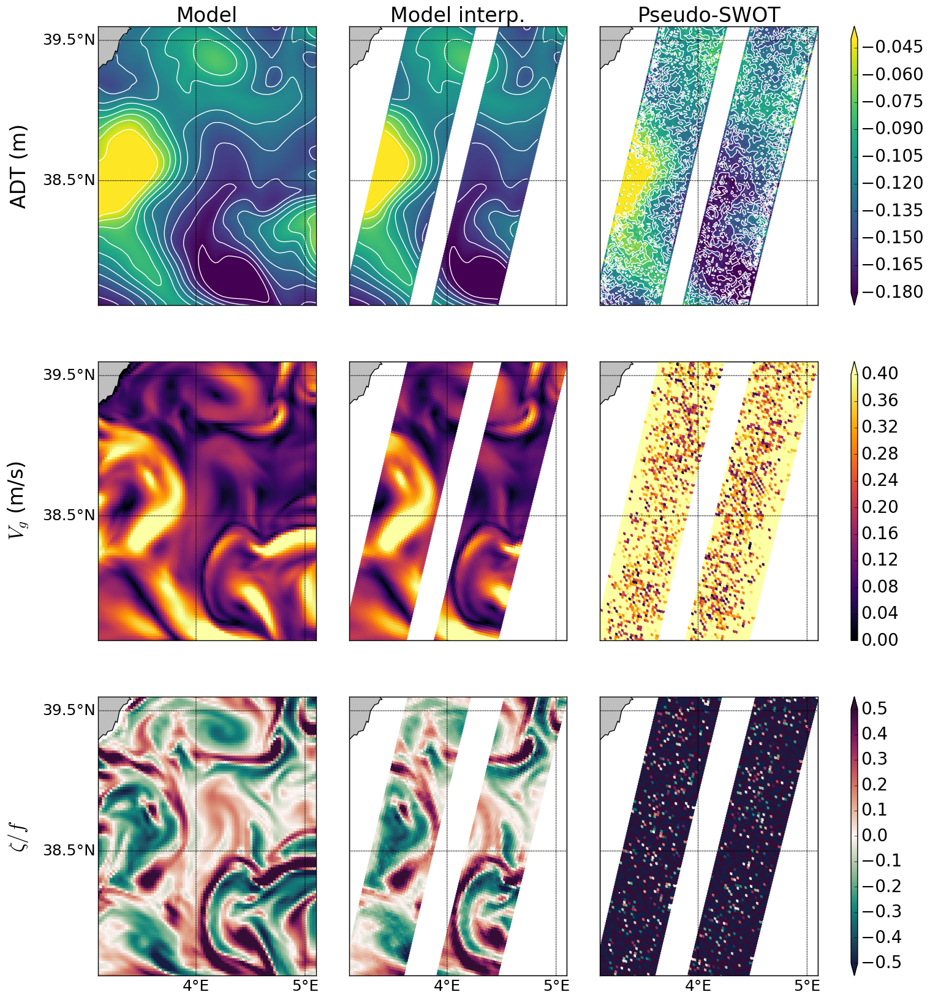

In [52]:
if __name__ == '__main__':
    
    cmap1 = 'viridis' #cmocean.cm.haline #same, viridis #getncvcm('banded', reverse=False, half=0)
    cmap2 = 'inferno' #worse, magma #getncvcm('manga', reverse=False, half=0)
    cmap3 = cmocean.cm.curl #pink green #'RdBu'
    
    plot_figrows = 3
    
    gs = gridspec.GridSpec(plot_figrows, 4, width_ratios=[.33, .33, .33, .01])
    
    vmin1 = -0.18
    vmax1 = -0.04
    
    vmin2 = 0.
    vmax2 = 0.4
    
    vmin3 = -0.5
    vmax3 = 0.5
        
    #lon_sat[lon_sat > 180] -= 360
    
    #SSH_r = np.ma.masked_invalid(SSH_r)
    
    fig1 = plt.figure(figsize=(16, 20))  # (w,h)
    
    for ii in xrange(0,plot_figrows):
        locals()["ax"+str(ii)+"1"] = plt.subplot(gs[ii,0])
        locals()["ax"+str(ii)+"2"] = plt.subplot(gs[ii,1])
        locals()["ax"+str(ii)+"3"] = plt.subplot(gs[ii,2])
    
    axC1 = plt.subplot(gs[0,-1])
    axC2 = plt.subplot(gs[1,-1])
    axC3 = plt.subplot(gs[2,-1])
    
    ##################################################
    
    my_map01, c1 = plot_swot(ax01, SSH_r, lon_r2, lat_r2, vmin1, vmax1, cmap1, merv=[0,0,0,0], parv=[1,0,0,1], box=box_p168, plotstyle='1', levels=levels_ssh)    
    ax01.set_ylabel('ADT (m)', labelpad=80, size = 24)
    ax01.set_title('Model', size=24)

    plot_swot(ax02, SSH_modelnb, lonnb, latnb, vmin1, vmax1, cmap1, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax02.set_title('Model interp.', size=24)
    
    plot_swot(ax03, SSH_obsnb, lonnb, latnb, vmin1, vmax1, cmap1, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax03.set_title('Pseudo-SWOT', size=24)
    
    # vel.
    
    my_map02, c2 = plot_swot(ax11, ar, lon_r2, lat_r2, vmin2, vmax2, cmap2, merv=[0,0,0,0], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax11.set_ylabel('$V_g$ (m/s)', labelpad=80, size = 24)
    
    plot_swot(ax12, am, lonnb, latnb, vmin2, vmax2, cmap2, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    plot_swot(ax13, ao, lonnb, latnb, vmin2, vmax2, cmap2, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # vort.
    my_map03, c3 = plot_swot(ax21, rb_r, lon_r2, lat_r2, vmin3, vmax3, cmap3, merv=[1,0,0,10], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax21.set_ylabel('$\zeta/f$', labelpad=80, size = 24)
    
    plot_swot(ax22, rb_m, lonnb, latnb, vmin3, vmax3, cmap3, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    plot_swot(ax23, rb_o, lonnb, latnb, vmin3, vmax3, cmap3, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    ####################################################################################
    
    cbar1 = plt.colorbar(c1, cax=axC1, extend='both')
    cbar1.ax.tick_params(labelsize=20)
    
    cbar2 = plt.colorbar(c2, cax=axC2, extend='max')
    cbar2.ax.tick_params(labelsize=20)
    
    cbar3 = plt.colorbar(c3, cax=axC3, extend='both')
    cbar3.ax.tick_params(labelsize=20)
    
    savename = '/Users/laura/Documents/scripts/IMEDEA/paperASR/new_version_remote_sensing/figs/' + '3_vars_p168_DEF' + '.jpeg'
    plt.savefig(str(savename), bbox_inches='tight', dpi=300)
    
    plt.show()


# Filtered ssh plot:

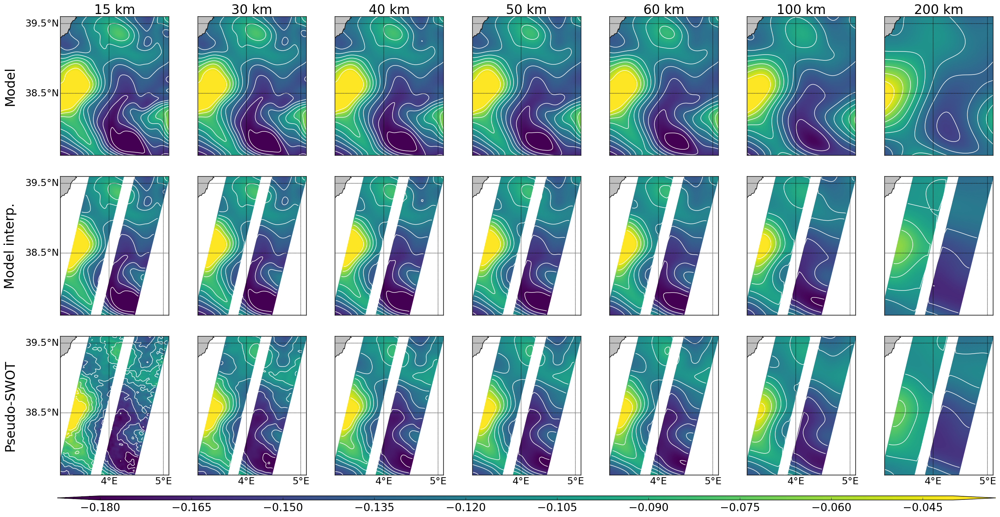

In [24]:
if __name__ == '__main__':
    cmap = 'viridis'
        
    plot_figrows = 7
    
    gs = gridspec.GridSpec(4, plot_figrows, width_ratios=[.14, .14, .14, .14, .14, .14, .14], height_ratios=[.33, .33, .33, .01])
    
    vmin = -0.18
    vmax = -0.04
    
    fig1 = plt.figure(figsize=(31, 16))  # (w,h)

    for ii in xrange(0, plot_figrows):
        locals()["ax"+str(ii)+"1"] = plt.subplot(gs[0,ii])
        locals()["ax"+str(ii)+"2"] = plt.subplot(gs[1,ii])
        locals()["ax"+str(ii)+"3"] = plt.subplot(gs[2,ii])
        
    axC = plt.subplot(gs[-1,:])
    
    ##################################################
    
    #16
    my_map04, c1 = plot_swot(ax01, ssh_r_LD16.T, lon_r2, lat_r2, vmin, vmax, cmap
                             , merv=[0,0,0,0], parv=[1,0,0,1], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax01.set_title('15 km', size = 24)
    ax01.set_ylabel('Model', labelpad=80, size=24)

    plot_swot(ax02, sshm_LD16, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[0,0,0,0]
              , parv=[1,0,0,1], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax02.set_ylabel('Model interp.', labelpad=80, size=24)

    plot_swot(ax03, ssho_LD16, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[1,0,0,1]
              , parv=[1,0,0,1], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax03.set_ylabel('Pseudo-SWOT', labelpad=80, size=24)
    
    #30
    
    plot_swot(ax11, ssh_r_LD30.T, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax11.set_title('30 km', size = 24)
    
    plot_swot(ax12, sshm_LD30, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    plot_swot(ax13, ssho_LD30, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    #40
    
    plot_swot(ax21, ssh_r_LD40.T, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax21.set_title('40 km', size = 24)
    
    plot_swot(ax22, sshm_LD40, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    plot_swot(ax23, ssho_LD40, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    #50
    
    plot_swot(ax31, ssh_r_LD50.T, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax31.set_title('50 km', size = 24)
    
    plot_swot(ax32, sshm_LD50, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    plot_swot(ax33, ssho_LD50, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    #60
    
    plot_swot(ax41, ssh_r_LD60.T, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax41.set_title('60 km', size = 24)
    
    plot_swot(ax42, sshm_LD60, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    plot_swot(ax43, ssho_LD60, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    # 100
    
    plot_swot(ax51,  ssh_r_LD100.T, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax51.set_title('100 km', size = 24)
    
    plot_swot(ax52, sshm_LD100, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    plot_swot(ax53, ssho_LD100, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    # 200
    
    plot_swot(ax61,  ssh_r_LD200.T, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    ax61.set_title('200 km', size = 24)
    
    plot_swot(ax62, sshm_LD200, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    plot_swot(ax63, ssho_LD200, lono_ssh, lato_ssh, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='1', levels=levels_ssh)
    
    ####################################################################################
    
    cbar = plt.colorbar(c1, cax=axC, orientation='horizontal', extend='both')
    cbar.ax.tick_params(labelsize=20)
    
    savename = '/Users/laura/Documents/scripts/IMEDEA/paperASR/new_version_remote_sensing/figs/' + 'adt_p168_zoom_cutoff_DEF' + '.jpeg'
    plt.savefig(str(savename), bbox_inches='tight', dpi=300)
    
    plt.show()


# Absolute geostrophic velocity:

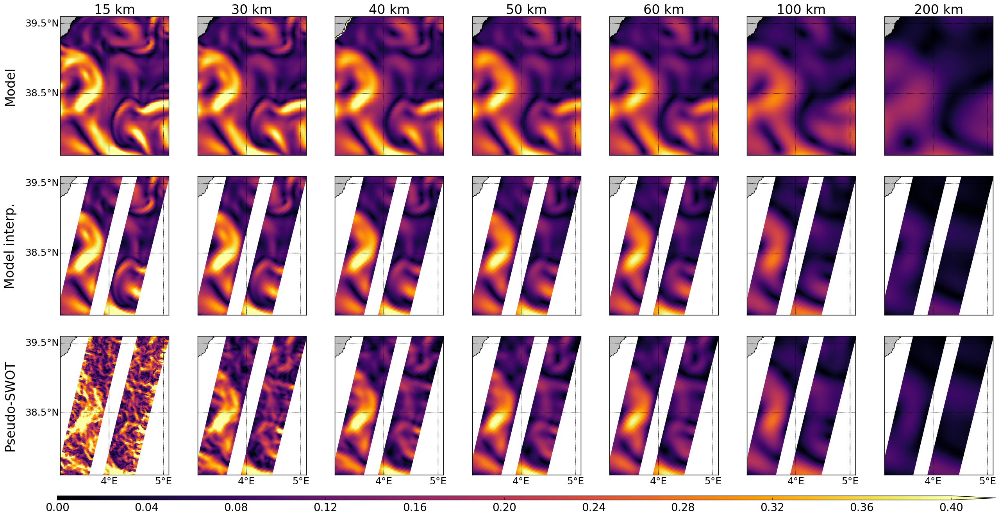

In [25]:
# ABSOLUTE GEOSTROPHIC VEL.
if __name__ == '__main__':
    cmap = 'inferno'

    plot_figrows = 7

    gs = gridspec.GridSpec(4, plot_figrows, width_ratios=[.14, .14, .14, .14, .14, .14, .14], height_ratios=[.33, .33, .33, .01])
   
    vmin = 0
    vmax = 0.4
    
    fig1 = plt.figure(figsize=(31, 16))  # (w,h)
    
    for ii in xrange(0, plot_figrows):
        locals()["ax"+str(ii)+"1"] = plt.subplot(gs[0,ii])
        locals()["ax"+str(ii)+"2"] = plt.subplot(gs[1,ii])
        locals()["ax"+str(ii)+"3"] = plt.subplot(gs[2,ii])
    
    axC = plt.subplot(gs[-1,:])
    
    ##################################################
            
    # 16
    mymap, c1 = plot_swot(ax01, ar16, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax01.set_title('15 km', size = 24)
    ax01.set_ylabel('Model', labelpad=80, size=24)

    plot_swot(ax02, am16, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax02.set_ylabel('Model interp.', labelpad=80, size=24)    
    plot_swot(ax03, ao16, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax03.set_ylabel('Pseudo-SWOT', labelpad=80, size=24)    
    
    # 30
    plot_swot(ax11, ar30, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax11.set_title('30 km', size = 24)
    plot_swot(ax12, am30, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax13, ao30, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 40
    plot_swot(ax21, ar40, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax21.set_title('40 km', size = 24)
    plot_swot(ax22, am40, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax23, ao40, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 50
    plot_swot(ax31, ar50, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax31.set_title('50 km', size = 24)
    plot_swot(ax32, am50, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax33, ao50, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 60
    plot_swot(ax41, ar60, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax41.set_title('60 km', size = 24)
    plot_swot(ax42, am60, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax43, ao60, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 100
    plot_swot(ax51, ar100, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax51.set_title('100 km', size = 24)
    plot_swot(ax52, am100, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax53, ao100, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')

    # 200
    plot_swot(ax61, ar200, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax61.set_title('200 km', size = 24)
    plot_swot(ax62, am200, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax63, ao200, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')

    ##############################################
    
    cbar = plt.colorbar(c1, cax=axC, orientation='horizontal', extend='max')
    cbar.ax.tick_params(labelsize=20)
    
    savename = '/Users/laura/Documents/scripts/IMEDEA/paperASR/new_version_remote_sensing/figs/' + 'vel_p168_zoom_cutoff_DEF' + '.jpeg'
    plt.savefig(str(savename), bbox_inches='tight', dpi=300)
    
    plt.show()


# Relative vorticity:

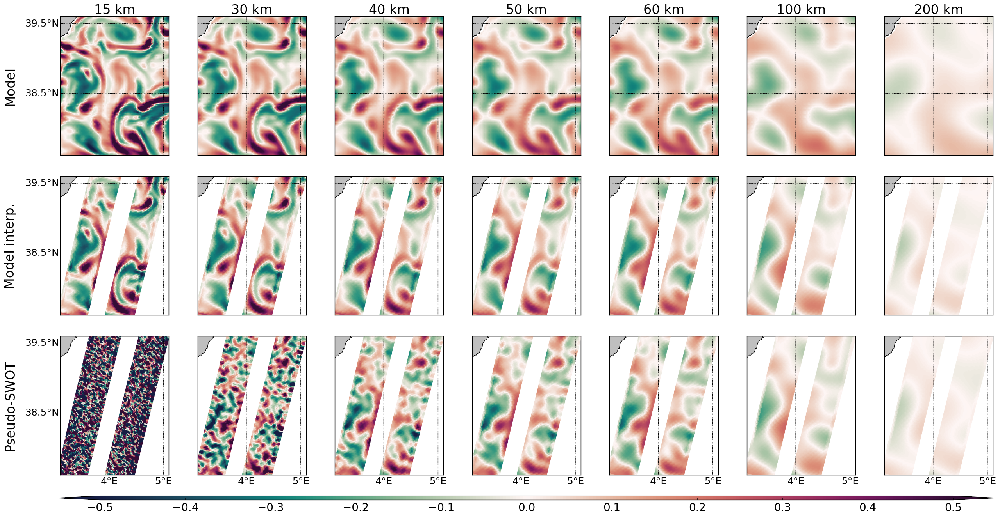

In [26]:
if __name__ == '__main__':
    
    cmap = cmocean.cm.curl #pink green #'RdBu'

    plot_figrows = 7
    
    gs = gridspec.GridSpec(4, plot_figrows, width_ratios=[.14, .14, .14, .14, .14, .14, .14], height_ratios=[.33, .33, .33, .01])

    vmin = -.5
    vmax = +.5
    
    fig1 = plt.figure(figsize=(31, 16))  # (w,h)
    
    for ii in xrange(0, plot_figrows):
        locals()["ax"+str(ii)+"1"] = plt.subplot(gs[0,ii])
        locals()["ax"+str(ii)+"2"] = plt.subplot(gs[1,ii])
        locals()["ax"+str(ii)+"3"] = plt.subplot(gs[2,ii])
    
    axC = plt.subplot(gs[-1,:])
    
    ##################################################
   
    # 16
    my_map01, c1 = plot_swot(ax01, vr16, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax01.set_title('15 km', size = 24)
    ax01.set_ylabel('Model', labelpad=80, size=24)
    plot_swot(ax02, vm16, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax02.set_ylabel('Model interp.', labelpad=80, size=24)
    plot_swot(ax03, vo16, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[1,0,0,1], box=box_p168, plotstyle='0')
    ax03.set_ylabel('Pseudo-SWOT', labelpad=80, size=24)
    
    # 30
    plot_swot(ax11, vr30, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax11.set_title('30 km', size = 24)
    plot_swot(ax12, vm30, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax13, vo30, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 40
    plot_swot(ax21, vr40, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax21.set_title('40 km', size = 24)
    plot_swot(ax22, vm40, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax23, vo40, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 50
    plot_swot(ax31, vr50, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax31.set_title('50 km', size = 24)
    plot_swot(ax32, vm50, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax33, vo50, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 60
    plot_swot(ax41, vr60, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax41.set_title('60 km', size = 24)
    plot_swot(ax42, vm60, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax43, vo60, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 100
    plot_swot(ax51, vr100, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax51.set_title('100 km', size = 24)
    plot_swot(ax52, vm100, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax53, vo100, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    
    # 200
    plot_swot(ax61, vr200, lon_r2, lat_r2, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    ax61.set_title('200 km', size = 24)
    plot_swot(ax62, vm200, lon_v, lat_v, vmin, vmax, cmap, merv=[0,0,0,0], parv=[0,0,0,0], box=box_p168, plotstyle='0')
    plot_swot(ax63, vo200, lon_v, lat_v, vmin, vmax, cmap, merv=[1,0,0,1], parv=[0,0,0,0], box=box_p168, plotstyle='0')

    ##############################################
    
    cbar = plt.colorbar(c1, cax=axC, orientation='horizontal', extend='both')
    cbar.ax.tick_params(labelsize=20)
    
    savename = '/Users/laura/Documents/scripts/IMEDEA/paperASR/new_version_remote_sensing/figs/' + 'vort_p168_zoom_cutoff_DEF' + '.jpeg'
    plt.savefig(str(savename), bbox_inches='tight', dpi=300)
    
    plt.show()


In [44]:
print 'vm16'
print np.nanmax(vm16)
print np.nanmin(vm16)
print 'vo16'
print np.nanmax(vo16)
print np.nanmin(vo16)
print 'vm30'
print np.nanmax(vm30)
print np.nanmin(vm30)
print 'vo30'
print np.nanmax(vo30)
print np.nanmin(vo30)
print 'vm40'
print np.nanmax(vm40)
print np.nanmin(vm40)
print 'vo40'
print np.nanmax(vo40)
print np.nanmin(vo40)
print 'vm50'
print np.nanmax(vm50)
print np.nanmin(vm50)
print 'vo50'
print np.nanmax(vo50)
print np.nanmin(vo50)
print 'vm60'
print np.nanmax(vm60)
print np.nanmin(vm60)
print 'vo60'
print np.nanmax(vo60)
print np.nanmin(vo60)
print 'vm100'
print np.nanmax(vm100)
print np.nanmin(vm100)
print 'vo100'
print np.nanmax(vo100)
print np.nanmin(vo100)
print 'vm200'
print np.nanmax(vm200)
print np.nanmin(vm200)
print 'vo200'
print np.nanmax(vo200)
print np.nanmin(vo200)

vm16
1.04796861971
-0.516736124886
vo16
3.21521815525
-3.67634060615
vm30
0.66475403178
-0.541428818036
vo30
1.07506829167
-1.22073520234
vm40
0.478172792743
-0.485508872606
vo40
0.526013991909
-0.569611182464
vm50
0.390938140824
-0.420494718889
vo50
0.413821626637
-0.436897753837
vm60
0.320967414778
-0.357518840838
vo60
0.317989309505
-0.372559392275
vm100
0.220800287191
-0.23726851803
vo100
0.228089950084
-0.232008066917
vm200
0.0703816801906
-0.101442563993
vo200
0.0627803412407
-0.0900035790469
